# Experiment №1

This notebook walks through the process of applying the Diffusion Lens technique
to analyze the intermediate steps of a diffusion model fine-tuned using Dreambooth.

**Goal:** We need to explore the difference of concepts representation related to the token, that chosen for the DreamBooth tuning approach.


In [1]:
import sys
import os

parent_dir = os.path.abspath(os.path.join('..'))
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

In [2]:
import torch
import os
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler  
from transformers import CLIPTextModel, CLIPTokenizer
from PIL import Image
from collections import OrderedDict  
from IPython.display import display 

# Import the custom Diffusion Lens pipeline
try:
    from DiffusionLens.pipeline_stable_diffusion import StableDiffusionPipeline as StableDiffusionGlassPipeline
except ImportError as e:
    print(f"Error importing DiffusionLens pipeline: {e}")
    print("Please ensure the 'DiffusionLens' directory is in the same directory as this notebook or accessible in the Python path.")
   
try:
    from src.model_setup import load_unet
    from src.utils import get_free_gpu 
except ImportError:
    print("Warning: Could not import from src. Ensure 'src' is in the Python path or adjust imports.")
    print("Using standard UNet loading as fallback.")
    
    def load_unet(base_model):
        print("Using standard from_pretrained method for UNet.")
        return UNet2DConditionModel.from_pretrained(base_model, subfolder="unet")
    def get_free_gpu(): return 0 

Using standard UNet loading as fallback.


## Configuration

In [9]:
# --- Model Paths ---
# Replace with your actual paths/IDs
MODEL_BASE = "runwayml/stable-diffusion-v1-5" # Base model used for Dreambooth training
UNET_PATH = "../outputs/dreambooth_dog/unet_final.pt" # Path to your fine-tuned UNet weights file (.pt, .bin, .safetensors)
TEXT_ENCODER_PATH = "../outputs/dreambooth_dog/text_encoder_final.pt" # Path to your fine-tuned text encoder weights file

# --- Analysis Parameters ---
PROMPT = "xon" 
NEGATIVE_PROMPT = "low quality, blurry, deformed"
OUTPUT_DIR = "output/dreambooth_lens_notebook" # Directory to save output images
SEED = 42
NUM_IMAGES_PER_PROMPT = 1 # Keep this at 1 for simplicity in visualizing layers
NUM_INFERENCE_STEPS = 100 # Standard number of steps
GUIDANCE_SCALE = 7.5

# --- Diffusion Lens Parameters ---
START_LAYER = 0             # Start visualization from this step/layer index
END_LAYER = 20              # End visualization at this step/layer index
STEP_LAYER = 1              # Visualize every N steps/layers

# --- Device and Precision ---
DEVICE = torch.device(f"cuda:{get_free_gpu()}" if torch.cuda.is_available() else "cpu") # Optional dynamic GPU
WEIGHT_DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32

print(f"Configuration:")
print(f"  Model Base: {MODEL_BASE}")
print(f"  UNet Path: {UNET_PATH}")
print(f"  Text Encoder Path: {TEXT_ENCODER_PATH}")
print(f"  Prompt: '{PROMPT}'")
print(f"  Output Dir: {OUTPUT_DIR}")
print(f"  Device: {DEVICE}, Weight Dtype: {WEIGHT_DTYPE}")
print(f"  Lens Params: Start={START_LAYER}, End={END_LAYER}, Step={STEP_LAYER}")

Configuration:
  Model Base: runwayml/stable-diffusion-v1-5
  UNet Path: ../outputs/dreambooth_dog/unet_final.pt
  Text Encoder Path: ../outputs/dreambooth_dog/text_encoder_final.pt
  Prompt: 'xon'
  Output Dir: output/dreambooth_lens_notebook
  Device: cuda:0, Weight Dtype: torch.float32
  Lens Params: Start=0, End=20, Step=1


In [4]:
try:
    print("Loading base tokenizer, scheduler, vae...")
    tokenizer = CLIPTokenizer.from_pretrained(MODEL_BASE, subfolder="tokenizer")
    scheduler = DDPMScheduler.from_pretrained(MODEL_BASE, subfolder="scheduler")
    vae = AutoencoderKL.from_pretrained(MODEL_BASE, subfolder="vae", torch_dtype=WEIGHT_DTYPE)
    print("Base components loaded.")
except Exception as e:
    print(f"Error loading base components from {MODEL_BASE}: {e}")
    raise

Loading base tokenizer, scheduler, vae...
Base components loaded.


### In the following experiment we interested in how the text encoder inject the information about our target image throw specified token used during DreamBooth fine-tuning.

# Set up №1 Load the pure text encoder

Let's explore how different layers of pure text encoder represent the notion of `xon` token.

In [5]:
try:
    print("Loading UNet and Text Encoder structures...")
    
    # Load UNet structure (weights will be loaded next)
    unet = load_unet(MODEL_BASE)
    
    # Load Text Encoder structure (weights will be loaded next)
    text_encoder = CLIPTextModel.from_pretrained(MODEL_BASE, subfolder="text_encoder")
    print("Structures loaded.")
except Exception as e:
    print(f"Error loading UNet/Text Encoder structures from {MODEL_BASE}: {e}")
    raise

Loading UNet and Text Encoder structures...
Using standard from_pretrained method for UNet.
Structures loaded.


In [6]:
try:
    # Load UNet weights
    print(f"Loading fine-tuned UNet weights from: {UNET_PATH}")
    unet_state_dict = torch.load(UNET_PATH, map_location="cpu")
    if not any("module." in k for k in unet_state_dict.keys()):
        unet.load_state_dict(unet_state_dict)
    else:
        print("  (Handling 'module.' prefix in UNet state_dict)")
        new_state_dict_unet = OrderedDict()
        for k, v in unet_state_dict.items():
            name = k[7:] if k.startswith("module.") else k
            new_state_dict_unet[name] = v
        unet.load_state_dict(new_state_dict_unet)
    print("UNet weights loaded.")

except FileNotFoundError as e:
    print(f"Error: Could not find state dict file: {e}")
    print(f"Please ensure UNET_PATH ('{UNET_PATH}') and TEXT_ENCODER_PATH ('{TEXT_ENCODER_PATH}') are correct.")
    raise
except Exception as e:
    print(f"Error loading state dicts: {e}")
    raise

Loading fine-tuned UNet weights from: ../outputs/dreambooth_dog/unet_final.pt


UNet weights loaded.


In [7]:
print(f"Moving models to {DEVICE} with dtype {WEIGHT_DTYPE}...")
unet.to(DEVICE, dtype=WEIGHT_DTYPE)
text_encoder.to(DEVICE, dtype=WEIGHT_DTYPE)
vae.to(DEVICE, dtype=WEIGHT_DTYPE)
unet.eval()
text_encoder.eval()
vae.eval()
print("Models moved and set to eval mode.")

Moving models to cuda:0 with dtype torch.float32...
Models moved and set to eval mode.


In [10]:
print("Instantiating Diffusion Lens pipeline...")
try:
    pipe = StableDiffusionGlassPipeline(
        vae=vae,
        text_encoder=text_encoder,
        tokenizer=tokenizer,
        unet=unet,
        scheduler=scheduler,
        safety_checker=None, 
        feature_extractor=None,
    )
    pipe.to(DEVICE) 
    print("Diffusion Lens pipeline instantiated.")
except Exception as e:
    print(f"Error instantiating Diffusion Lens pipeline: {e}")
    print("Check compatibility, especially the scheduler type.")
    raise

/home/i_golov/.cache/pypoetry/virtualenvs/gai-course-project-FHjCIQR8-py3.12/lib/python3.12/site-packages/diffusers/loaders/lora_pipeline.py:3811: FutureWarning: `LoraLoaderMixin` is deprecated and will be removed in version 1.0.0. LoraLoaderMixin is deprecated and this will be removed in a future version. Please use `StableDiffusionLoraLoaderMixin`, instead.
  deprecate("LoraLoaderMixin", "1.0.0", deprecation_message)
You have disabled the safety checker for <class 'DiffusionLens.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at 

Instantiating Diffusion Lens pipeline...
Diffusion Lens pipeline instantiated.


In [15]:
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output directory: {OUTPUT_DIR}")

generator = torch.Generator(DEVICE).manual_seed(SEED)
print(f"Using random seed: {SEED}")

Output directory: output/dreambooth_lens_notebook
Using random seed: 42


In [16]:
print(f"Running pipeline for prompt: '{PROMPT}'")
print(f"Visualizing text encoder layers from {START_LAYER} to {END_LAYER} (exclusive) with step {STEP_LAYER}")

try:
    layer_outputs = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        num_inference_steps=NUM_INFERENCE_STEPS,
        guidance_scale=GUIDANCE_SCALE,
        generator=generator,
        num_images_per_prompt=NUM_IMAGES_PER_PROMPT,
        start_layer=START_LAYER,  
        end_layer=END_LAYER,
        step_layer=STEP_LAYER,
        output_type="pil" # Get PIL images
    )
    print(f"Pipeline finished. Received {len(layer_outputs)} layer outputs.")

except Exception as e:
    print(f"Error during pipeline execution: {e}")
    print("This might be due to incompatible lens parameters (start/end/step_layer)")
    print("or issues with the custom pipeline implementation (e.g., scheduler).")
    raise

Running pipeline for prompt: 'xon'
Visualizing text encoder layers from 0 to 20 (exclusive) with step 1
layer: 0 - using final_layer_norm
layer: 1 - using final_layer_norm
layer: 2 - using final_layer_norm
layer: 3 - using final_layer_norm
layer: 4 - using final_layer_norm
layer: 5 - using final_layer_norm
layer: 6 - using final_layer_norm
layer: 7 - using final_layer_norm
layer: 8 - using final_layer_norm
layer: 9 - using final_layer_norm
layer: 10 - using final_layer_norm
layer: 11 - using final_layer_norm
layer: 12 - still using final_layer_norm
Timesteps: tensor([991, 981, 971, 961, 951, 941, 931, 921, 911, 901, 891, 881, 871, 861,
        851, 841, 831, 821, 811, 801, 791, 781, 771, 761, 751, 741, 731, 721,
        711, 701, 691, 681, 671, 661, 651, 641, 631, 621, 611, 601, 591, 581,
        571, 561, 551, 541, 531, 521, 511, 501, 491, 481, 471, 461, 451, 441,
        431, 421, 411, 401, 391, 381, 371, 361, 351, 341, 331, 321, 311, 301,
        291, 281, 271, 261, 251, 241, 231, 2

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

Processing 13 results...
Saved image for layer 0 to output/dreambooth_lens_notebook/layer_000_step_000.png
Displaying image generated using Text Encoder Layer 0:


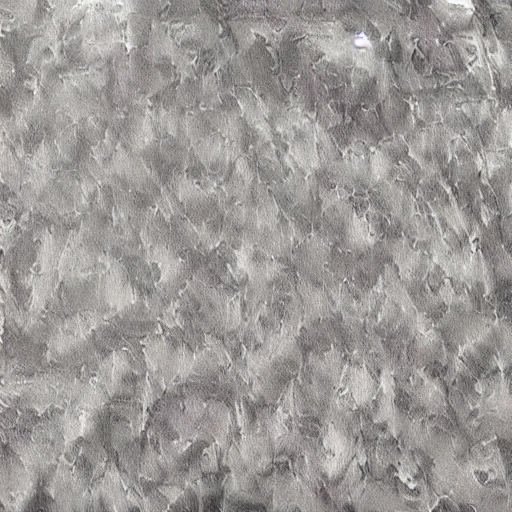

------------------------------
Saved image for layer 1 to output/dreambooth_lens_notebook/layer_001_step_001.png
Displaying image generated using Text Encoder Layer 1:


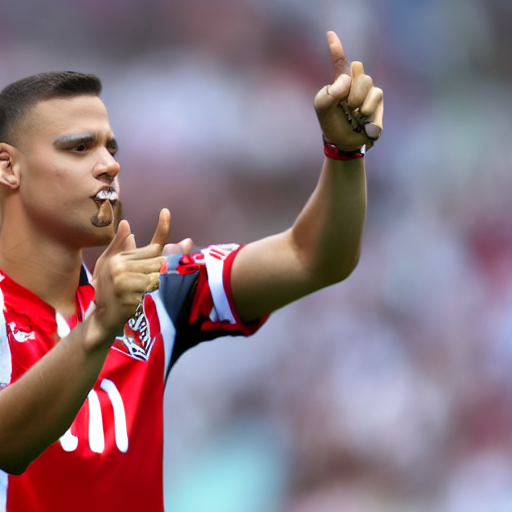

------------------------------
Saved image for layer 2 to output/dreambooth_lens_notebook/layer_002_step_002.png
Displaying image generated using Text Encoder Layer 2:


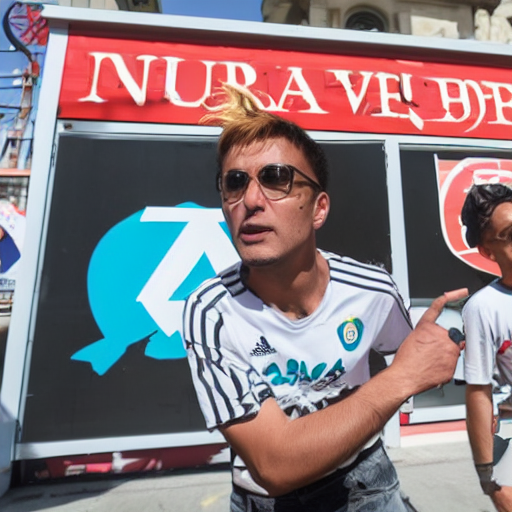

------------------------------
Saved image for layer 3 to output/dreambooth_lens_notebook/layer_003_step_003.png
Displaying image generated using Text Encoder Layer 3:


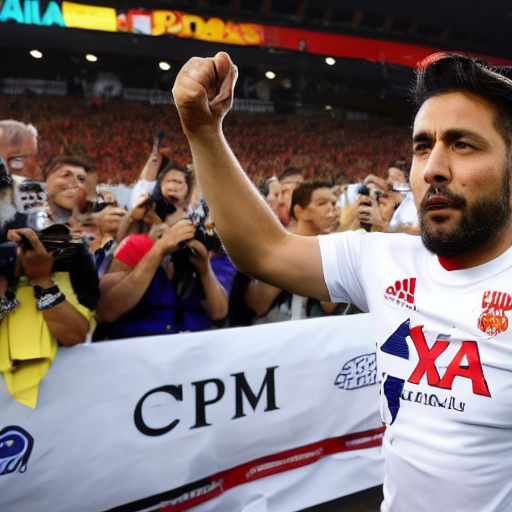

------------------------------
Saved image for layer 4 to output/dreambooth_lens_notebook/layer_004_step_004.png
Displaying image generated using Text Encoder Layer 4:


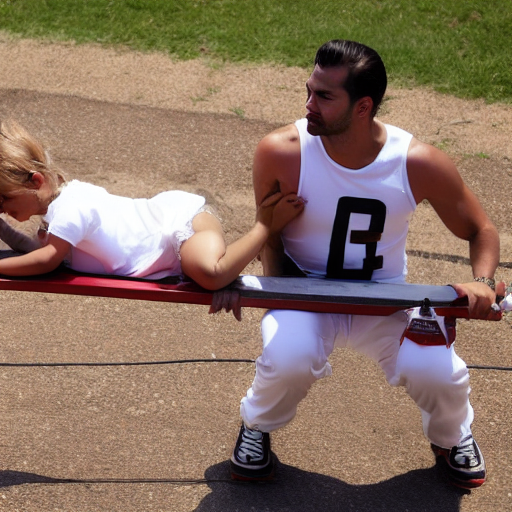

------------------------------
Saved image for layer 5 to output/dreambooth_lens_notebook/layer_005_step_005.png
Displaying image generated using Text Encoder Layer 5:


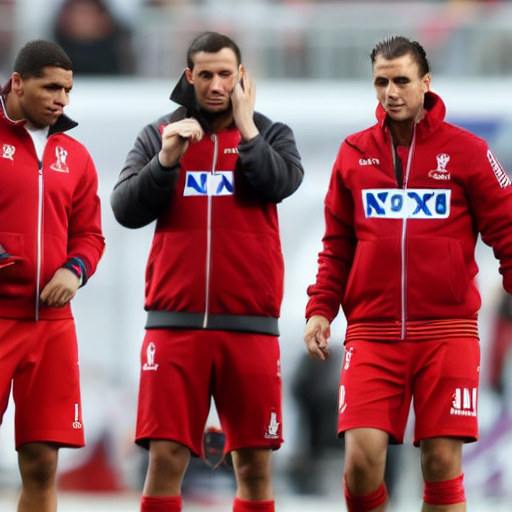

------------------------------
Saved image for layer 6 to output/dreambooth_lens_notebook/layer_006_step_006.png
Displaying image generated using Text Encoder Layer 6:


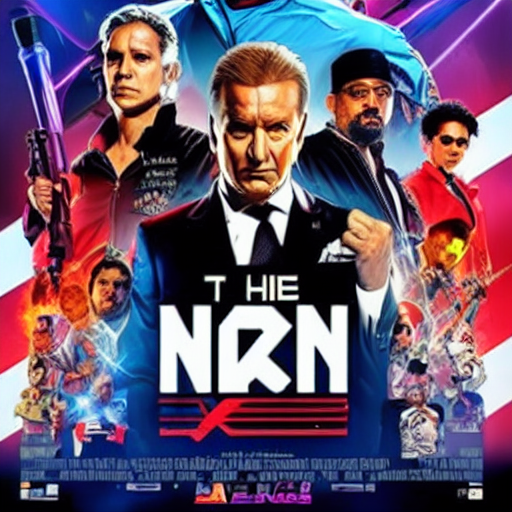

------------------------------
Saved image for layer 7 to output/dreambooth_lens_notebook/layer_007_step_007.png
Displaying image generated using Text Encoder Layer 7:


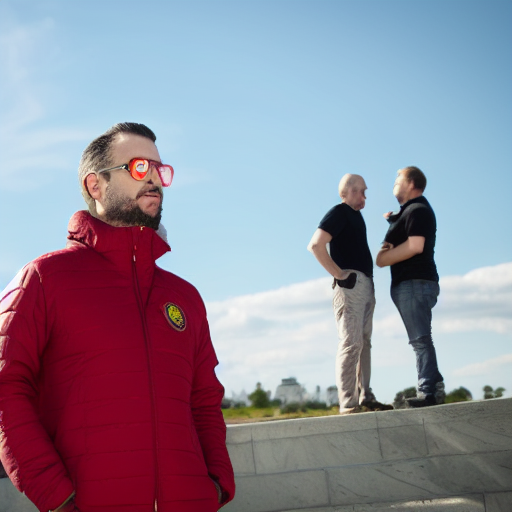

------------------------------
Saved image for layer 8 to output/dreambooth_lens_notebook/layer_008_step_008.png
Displaying image generated using Text Encoder Layer 8:


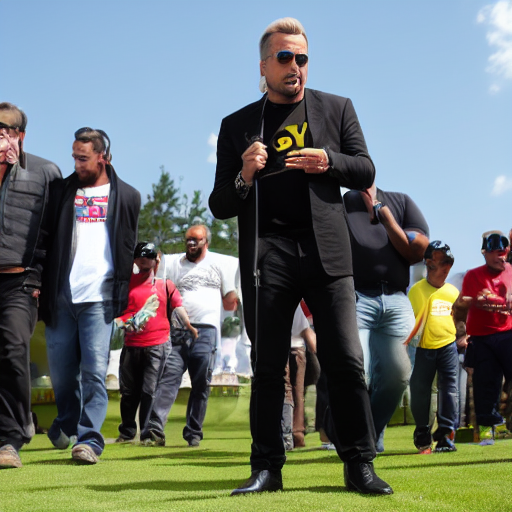

------------------------------
Saved image for layer 9 to output/dreambooth_lens_notebook/layer_009_step_009.png
Displaying image generated using Text Encoder Layer 9:


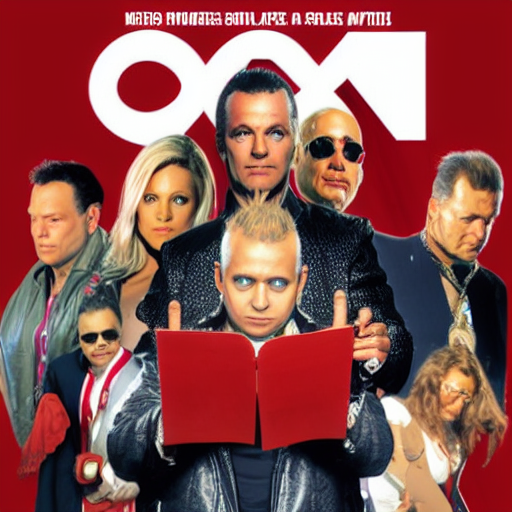

------------------------------
Saved image for layer 10 to output/dreambooth_lens_notebook/layer_010_step_010.png
Displaying image generated using Text Encoder Layer 10:


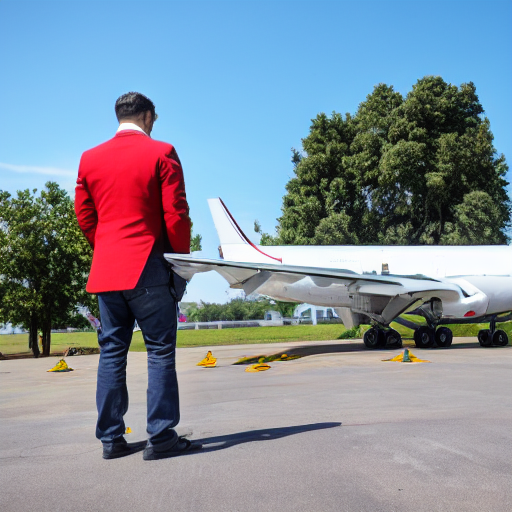

------------------------------
Saved image for layer 11 to output/dreambooth_lens_notebook/layer_011_step_011.png
Displaying image generated using Text Encoder Layer 11:


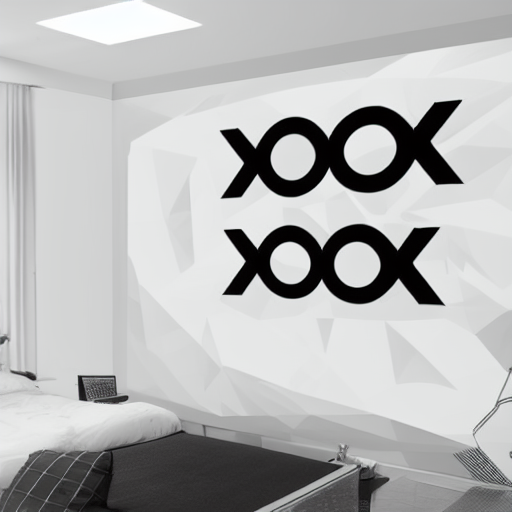

------------------------------
Saved image for layer 12 to output/dreambooth_lens_notebook/layer_012_step_012.png
Displaying image generated using Text Encoder Layer 12:


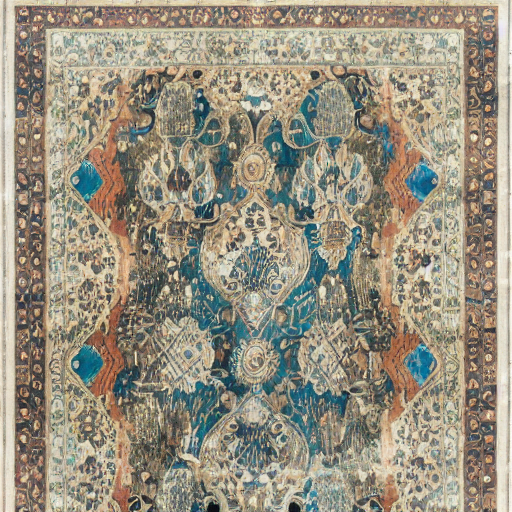

------------------------------
Analysis complete. Images saved in: output/dreambooth_lens_notebook


In [17]:
print(f"Processing {len(layer_outputs)} results...")
current_layer_index = START_LAYER

for i, output in enumerate(layer_outputs):
    if not hasattr(output, 'images') or not output.images:
        print(f"Warning: No images found in output for layer index {i} (corresponds to approx layer {current_layer_index})")
        continue

    # Get the first image (since num_images_per_prompt = 1)
    img = output.images[0]

    # Define filename
    # The actual layer index from the text encoder used is start_layer + i * step_layer
    actual_layer_num = START_LAYER + i * STEP_LAYER
    layer_filename = f"layer_{actual_layer_num:03d}_step_{i:03d}.png"
    output_path = os.path.join(OUTPUT_DIR, layer_filename)

    # Save the image
    img.save(output_path)
    print(f"Saved image for layer {actual_layer_num} to {output_path}")

    # Display the image inline
    print(f"Displaying image generated using Text Encoder Layer {actual_layer_num}:")
    display(img)
    print("-" * 30)

    # Increment for the next loop iteration's layer name (though actual_layer_num is calculated directly)
    # current_layer_index += STEP_LAYER # Not strictly needed if using actual_layer_num

print("Analysis complete. Images saved in:", OUTPUT_DIR)

# Set up №2 Load the pretrained text encoder

Now, let's load the pretrained text encoder. We expect that we see how the information of our target object injected and associated.

In [18]:
try:
    print("Loading UNet and Text Encoder structures...")
    
    # Load UNet structure (weights will be loaded next)
    unet = load_unet(MODEL_BASE)
    
    # Load Text Encoder structure (weights will be loaded next)
    text_encoder = CLIPTextModel.from_pretrained(MODEL_BASE, subfolder="text_encoder")
    print("Structures loaded.")
except Exception as e:
    print(f"Error loading UNet/Text Encoder structures from {MODEL_BASE}: {e}")
    raise

Loading UNet and Text Encoder structures...
Using standard from_pretrained method for UNet.
Structures loaded.


In [19]:
try:
    # Load UNet weights
    print(f"Loading fine-tuned UNet weights from: {UNET_PATH}")
    unet_state_dict = torch.load(UNET_PATH, map_location="cpu")
    if not any("module." in k for k in unet_state_dict.keys()):
        unet.load_state_dict(unet_state_dict)
    else:
        print("  (Handling 'module.' prefix in UNet state_dict)")
        new_state_dict_unet = OrderedDict()
        for k, v in unet_state_dict.items():
            name = k[7:] if k.startswith("module.") else k
            new_state_dict_unet[name] = v
        unet.load_state_dict(new_state_dict_unet)
    print("UNet weights loaded.")

    # Load Text Encoder weights
    print(f"Loading fine-tuned Text Encoder weights from: {TEXT_ENCODER_PATH}")
    text_encoder_state_dict = torch.load(TEXT_ENCODER_PATH, map_location="cpu")
    if not any("module." in k for k in text_encoder_state_dict.keys()):
        text_encoder.load_state_dict(text_encoder_state_dict)
    else:
        print("  (Handling 'module.' prefix in Text Encoder state_dict)")
        new_state_dict_text_encoder = OrderedDict()
        for k, v in text_encoder_state_dict.items():
            name = k[7:] if k.startswith("module.") else k
            new_state_dict_text_encoder[name] = v
        text_encoder.load_state_dict(new_state_dict_text_encoder)
    print("Text Encoder weights loaded.")

except FileNotFoundError as e:
    print(f"Error: Could not find state dict file: {e}")
    print(f"Please ensure UNET_PATH ('{UNET_PATH}') and TEXT_ENCODER_PATH ('{TEXT_ENCODER_PATH}') are correct.")
    raise
except Exception as e:
    print(f"Error loading state dicts: {e}")
    raise

Loading fine-tuned UNet weights from: ../outputs/dreambooth_dog/unet_final.pt
UNet weights loaded.
Loading fine-tuned Text Encoder weights from: ../outputs/dreambooth_dog/text_encoder_final.pt
Text Encoder weights loaded.


In [20]:
print(f"Moving models to {DEVICE} with dtype {WEIGHT_DTYPE}...")
unet.to(DEVICE, dtype=WEIGHT_DTYPE)
text_encoder.to(DEVICE, dtype=WEIGHT_DTYPE)
vae.to(DEVICE, dtype=WEIGHT_DTYPE)
unet.eval()
text_encoder.eval()
vae.eval()
print("Models moved and set to eval mode.")

Moving models to cuda:0 with dtype torch.float32...
Models moved and set to eval mode.


In [21]:
print("Instantiating Diffusion Lens pipeline...")
try:
    pipe = StableDiffusionGlassPipeline(
        vae=vae,
        text_encoder=text_encoder,
        tokenizer=tokenizer,
        unet=unet,
        scheduler=scheduler,
        safety_checker=None, 
        feature_extractor=None,
    )
    pipe.to(DEVICE) 
    print("Diffusion Lens pipeline instantiated.")
except Exception as e:
    print(f"Error instantiating Diffusion Lens pipeline: {e}")
    print("Check compatibility, especially the scheduler type.")
    raise

/home/i_golov/.cache/pypoetry/virtualenvs/gai-course-project-FHjCIQR8-py3.12/lib/python3.12/site-packages/diffusers/loaders/lora_pipeline.py:3811: FutureWarning: `LoraLoaderMixin` is deprecated and will be removed in version 1.0.0. LoraLoaderMixin is deprecated and this will be removed in a future version. Please use `StableDiffusionLoraLoaderMixin`, instead.
  deprecate("LoraLoaderMixin", "1.0.0", deprecation_message)
You have disabled the safety checker for <class 'DiffusionLens.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at 

Instantiating Diffusion Lens pipeline...
Diffusion Lens pipeline instantiated.


In [25]:
OUTPUT_DIR = OUTPUT_DIR+'_trained'

In [26]:
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output directory: {OUTPUT_DIR}")

generator = torch.Generator(DEVICE).manual_seed(SEED)
print(f"Using random seed: {SEED}")

Output directory: output/dreambooth_lens_notebook_trained
Using random seed: 42


In [27]:
print(f"Running pipeline for prompt: '{PROMPT}'")
print(f"Visualizing text encoder layers from {START_LAYER} to {END_LAYER} (exclusive) with step {STEP_LAYER}")

try:
    layer_outputs = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        num_inference_steps=NUM_INFERENCE_STEPS,
        guidance_scale=GUIDANCE_SCALE,
        generator=generator,
        num_images_per_prompt=NUM_IMAGES_PER_PROMPT,
        start_layer=START_LAYER,  
        end_layer=END_LAYER,
        step_layer=STEP_LAYER,
        output_type="pil" # Get PIL images
    )
    print(f"Pipeline finished. Received {len(layer_outputs)} layer outputs.")

except Exception as e:
    print(f"Error during pipeline execution: {e}")
    print("This might be due to incompatible lens parameters (start/end/step_layer)")
    print("or issues with the custom pipeline implementation (e.g., scheduler).")
    raise

Running pipeline for prompt: 'xon'
Visualizing text encoder layers from 0 to 20 (exclusive) with step 1
layer: 0 - using final_layer_norm
layer: 1 - using final_layer_norm
layer: 2 - using final_layer_norm
layer: 3 - using final_layer_norm
layer: 4 - using final_layer_norm
layer: 5 - using final_layer_norm
layer: 6 - using final_layer_norm
layer: 7 - using final_layer_norm
layer: 8 - using final_layer_norm
layer: 9 - using final_layer_norm
layer: 10 - using final_layer_norm
layer: 11 - using final_layer_norm
layer: 12 - still using final_layer_norm
Timesteps: tensor([991, 981, 971, 961, 951, 941, 931, 921, 911, 901, 891, 881, 871, 861,
        851, 841, 831, 821, 811, 801, 791, 781, 771, 761, 751, 741, 731, 721,
        711, 701, 691, 681, 671, 661, 651, 641, 631, 621, 611, 601, 591, 581,
        571, 561, 551, 541, 531, 521, 511, 501, 491, 481, 471, 461, 451, 441,
        431, 421, 411, 401, 391, 381, 371, 361, 351, 341, 331, 321, 311, 301,
        291, 281, 271, 261, 251, 241, 231, 2

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration: 0, t: 991
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 1, t: 981
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 2, t: 971
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 3, t: 961
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 4, t: 951
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 5, t: 941
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 6, t: 931
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 7, t: 921
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 8, t: 911
noise pred shape: torch.Size([1, 4, 64, 64])
latents shape: torch.Size([1, 4, 64, 64])
Iteration: 9, t: 901
noise p

Processing 13 results...
Saved image for layer 0 to output/dreambooth_lens_notebook_trained/layer_000_step_000.png
Displaying image generated using Text Encoder Layer 0:


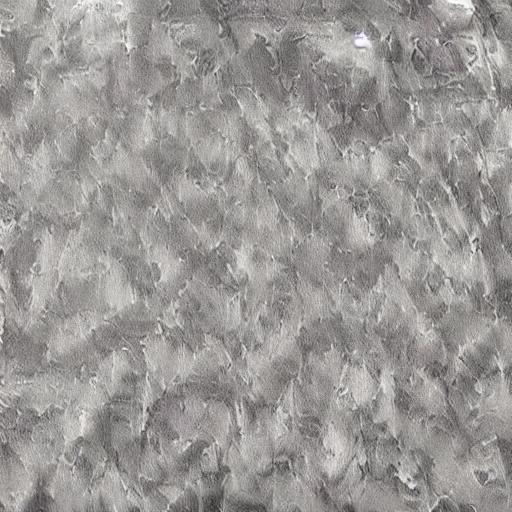

------------------------------
Saved image for layer 1 to output/dreambooth_lens_notebook_trained/layer_001_step_001.png
Displaying image generated using Text Encoder Layer 1:


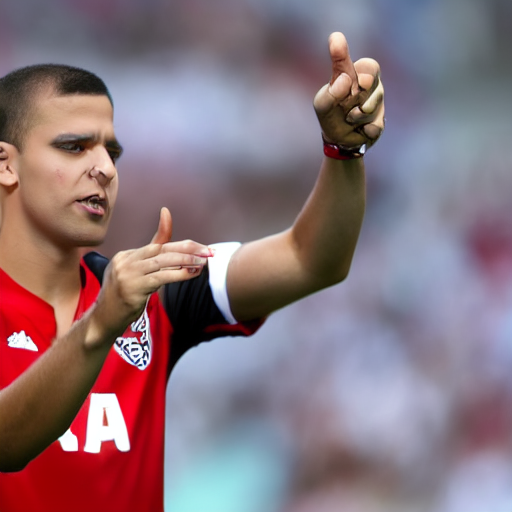

------------------------------
Saved image for layer 2 to output/dreambooth_lens_notebook_trained/layer_002_step_002.png
Displaying image generated using Text Encoder Layer 2:


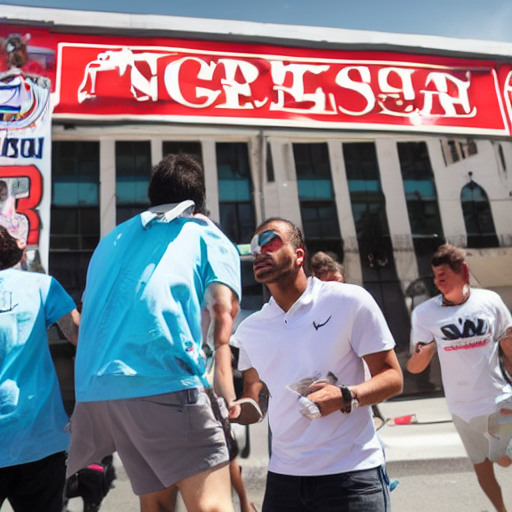

------------------------------
Saved image for layer 3 to output/dreambooth_lens_notebook_trained/layer_003_step_003.png
Displaying image generated using Text Encoder Layer 3:


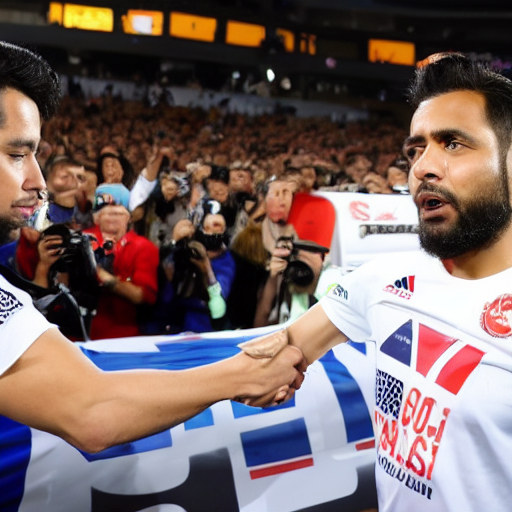

------------------------------
Saved image for layer 4 to output/dreambooth_lens_notebook_trained/layer_004_step_004.png
Displaying image generated using Text Encoder Layer 4:


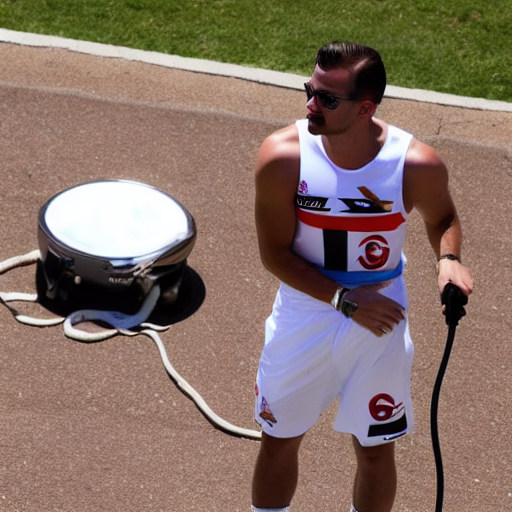

------------------------------
Saved image for layer 5 to output/dreambooth_lens_notebook_trained/layer_005_step_005.png
Displaying image generated using Text Encoder Layer 5:


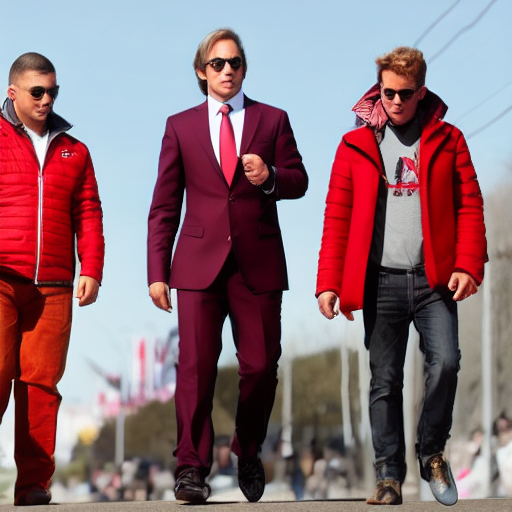

------------------------------
Saved image for layer 6 to output/dreambooth_lens_notebook_trained/layer_006_step_006.png
Displaying image generated using Text Encoder Layer 6:


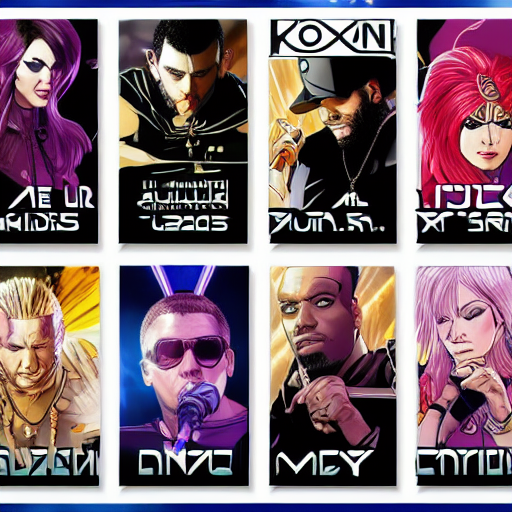

------------------------------
Saved image for layer 7 to output/dreambooth_lens_notebook_trained/layer_007_step_007.png
Displaying image generated using Text Encoder Layer 7:


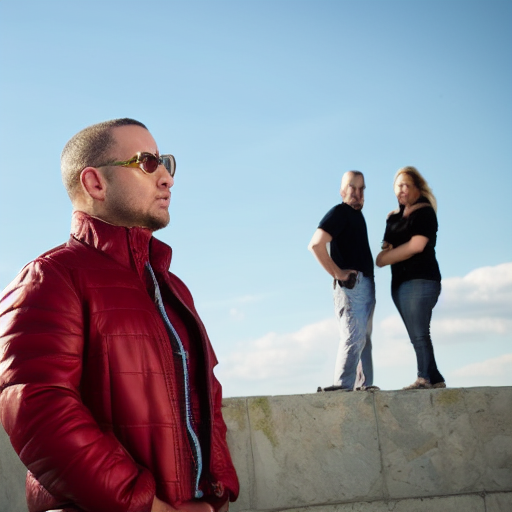

------------------------------
Saved image for layer 8 to output/dreambooth_lens_notebook_trained/layer_008_step_008.png
Displaying image generated using Text Encoder Layer 8:


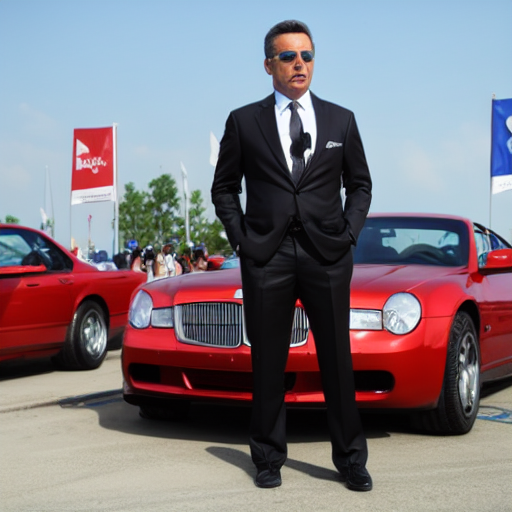

------------------------------
Saved image for layer 9 to output/dreambooth_lens_notebook_trained/layer_009_step_009.png
Displaying image generated using Text Encoder Layer 9:


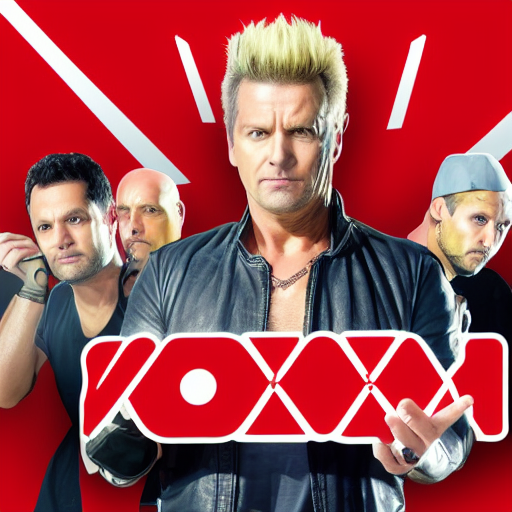

------------------------------
Saved image for layer 10 to output/dreambooth_lens_notebook_trained/layer_010_step_010.png
Displaying image generated using Text Encoder Layer 10:


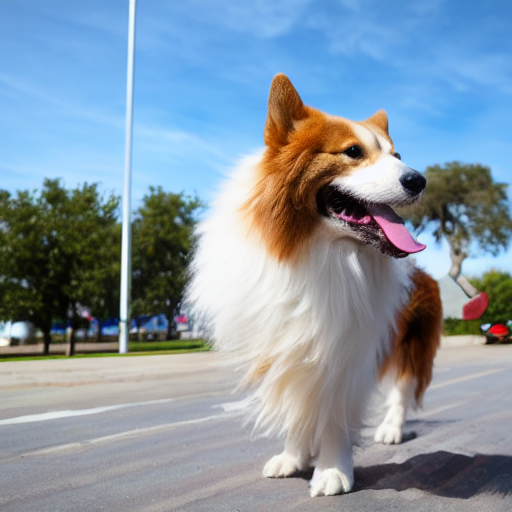

------------------------------
Saved image for layer 11 to output/dreambooth_lens_notebook_trained/layer_011_step_011.png
Displaying image generated using Text Encoder Layer 11:


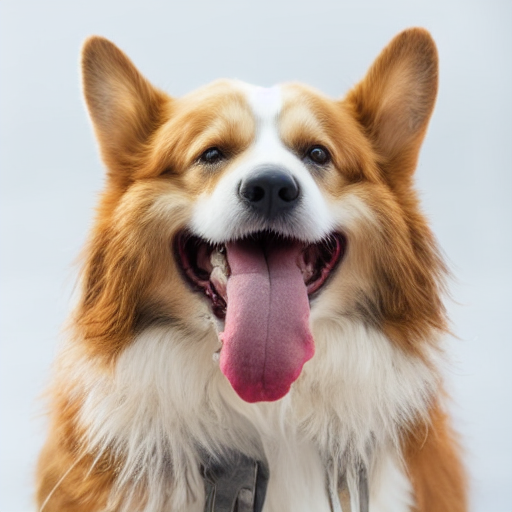

------------------------------
Saved image for layer 12 to output/dreambooth_lens_notebook_trained/layer_012_step_012.png
Displaying image generated using Text Encoder Layer 12:


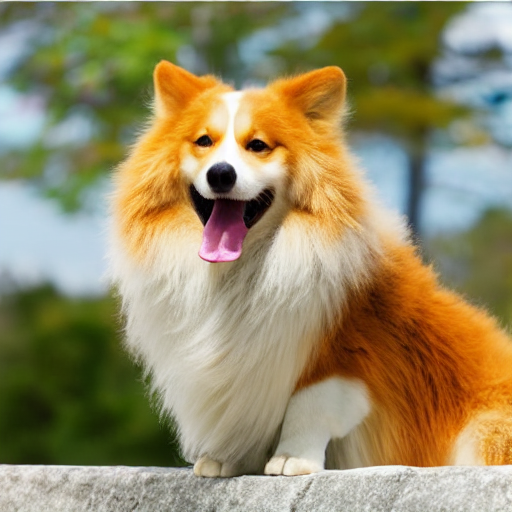

------------------------------
Analysis complete. Images saved in: output/dreambooth_lens_notebook_trained


In [ ]:
print(f"Processing {len(layer_outputs)} results...")
current_layer_index = START_LAYER

for i, output in enumerate(layer_outputs):
    if not hasattr(output, 'images') or not output.images:
        print(f"Warning: No images found in output for layer index {i} (corresponds to approx layer {current_layer_index})")
        continue

    # Get the first image (since num_images_per_prompt = 1)
    img = output.images[0]

    # Define filename
    # The actual layer index from the text encoder used is start_layer + i * step_layer
    actual_layer_num = START_LAYER + i * STEP_LAYER
    layer_filename = f"layer_{actual_layer_num:03d}_step_{i:03d}.png"
    output_path = os.path.join(OUTPUT_DIR, layer_filename)

    # Save the image
    img.save(output_path)
    print(f"Saved image for layer {actual_layer_num} to {output_path}")

    # Display the image inline
    print(f"Displaying image generated using Text Encoder Layer {actual_layer_num}:")
    display(img)
    print("-" * 30)

print("Analysis complete. Images saved in:", OUTPUT_DIR)

# Conclusion

We see that till up to the 10th layer, the difference in understanding the xon concept between the pure text encoder and the trained text encoder is not dramatic. However, beyond that point, the subsequent layers begin to retain and emphasize information specifically related to our dog. This suggests that the deeper layers of the text encoder are more responsible for capturing fine-grained, learned representations associated with the fine-tuned concept.
Overall, the experiment demonstrates that DreamBooth fine-tuning impacts the deeper layers of the text encoder more significantly, encoding concept-specific details that were not present in the original model. This insight can guide future work in understanding where and how personalization occurs in diffusion model pipelines.